Below functions taken from Professor Snyder

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa 
import librosa.display
from IPython.display import Audio

from scipy import signal

from scipy.signal import find_peaks, windows

SR            = 22050 

In [3]:
def makeSignal(S=[(440,1,0)], A = None, duration=1.0,sr=SR):
    X = np.zeros(int(sr*duration)) 
    T = np.arange(int(sr*duration))
    for (f,amp,phi) in S:         
        X +=  amp * np.sin( 2 * np.pi * f * T / sr + phi )
    X / max(X)         # normalize to amplitude 1.0
    if(A == None):
        return  X       
    else:
        return  A * X   

In [4]:
# get signal array and sample rate from a local audio file, will resample to 
#     default SR of 22050

import soundfile as sf
import io
import warnings

from six.moves.urllib.request import urlopen

def readSignal(name,sr=None):    
    if(name[:5] == 'https'):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            X, fileSR = sf.read(io.BytesIO(urlopen(name).read()))           
    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            X, fileSR = librosa.load(name)
    if((sr == None) or (fileSR == sr)):
        return X
    else:
        return librosa.resample(X,fileSR,SR) 

# write signal array out to a file in your local directory (or to complete path name)

def writeSignal(name,data,sr=SR):
    sf.write(name,data,sr)
    

In [5]:
# display the waveform using librosa

def displaySignal(x,sr=SR,title='Signal X',):
    plt.figure(figsize=(12,6))
    plt.title(title)
    plt.ylim([-1.1,1.1])           # if you want the full range -1 .. 1, else will adapt to signal
    plt.plot([0,librosa.get_duration(x)],[0,0],linewidth=1,color='k') # if you want a 0 line
    #plt.grid()                    # if you want gridlines
    librosa.display.waveshow(x,sr=sr)
    plt.show()
    
# X = readSignal(k + "trumpet_A4_1_forte_normal.wav")

# displaySignal(X)

In [6]:
#cd Train
#cd Test

SyntaxError: invalid syntax (Temp/ipykernel_5288/3566926198.py, line 2)

In [6]:
# Original files scraped off youtube

#Japanese = readSignal("Japanese.wav") 
#Chinese = readSignal("Chinese.wav") 
#English = readSignal("English.wav") 
#French = readSignal("French.wav") 
#Italian = readSignal("Italian.wav") 
#Korean = readSignal("Korean.wav") 
#Spanish = readSignal("Spanish.wav") 

Japanese = readSignal("TestJapanese.wav") 
Chinese = readSignal("TestChinese.wav") 
English = readSignal("TestEnglish.wav") 
French = readSignal("TestFrench.wav") 
Italian = readSignal("TestItalian.wav") 
Korean = readSignal("TestKorean.wav") 
Spanish = readSignal("TestSpanish.wav") 

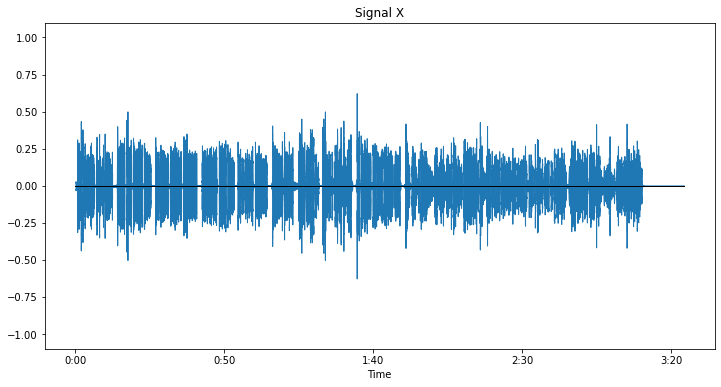

In [7]:
displaySignal(Japanese)
Audio(Japanese,rate=SR)

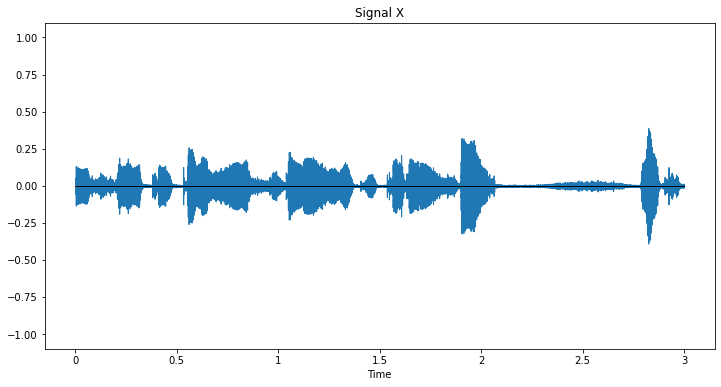

In [7]:
# Get 3 second clips
lower = 0+3
upper = 3+3
new = Japanese[int(SR)*lower:int(SR)*upper]
displaySignal(new)
Audio(new,rate=SR)

In [61]:
# This is for when the file is a long video
import pandas as pd

signalDf = pd.DataFrame()

# get 3 second slices to give to the dataframe; upperbound/3 is the number of samples
#upperbound of 1500 = 25 minutes in total, 1200 = 20 minutes --> 400 samples for current language

#upperLimit = 1200
upperLimit = 120

jVals = [Japanese[int(SR)*bound:int(SR)*(bound+3)] for bound in range(0, upperLimit, 3)] 
cVals = [Chinese[int(SR)*bound:int(SR)*(bound+3)] for bound in range(0, upperLimit, 3)] 
eVals = [English[int(SR)*bound:int(SR)*(bound+3)] for bound in range(0, upperLimit, 3)] 
fVals = [French[int(SR)*bound:int(SR)*(bound+3)] for bound in range(0, upperLimit, 3)] 
iVals = [Italian[int(SR)*bound:int(SR)*(bound+3)] for bound in range(0, upperLimit, 3)] 
kVals = [Korean[int(SR)*bound:int(SR)*(bound+3)] for bound in range(0, upperLimit, 3)] 
sVals = [Spanish[int(SR)*bound:int(SR)*(bound+3)] for bound in range(0, upperLimit, 3)] 


signalDf['Signal'] = (jVals+cVals+eVals+fVals+iVals+kVals+sVals)

In [8]:
path = "Test/Alternative/"

os.listdir(path + 'Japanese')

['101362.wav',
 '102315.wav',
 '102792.wav',
 '102805.wav',
 '1034968.wav',
 '1068624.wav',
 '115002.wav',
 '1167794.wav',
 '123832.wav',
 '125778.wav',
 '126556.wav',
 '126559.wav',
 '127070.wav',
 '1284072.wav',
 '1301211.wav',
 '1301433.wav',
 '1302432.wav',
 '1302434.wav',
 '137492.wav',
 '140211.wav',
 '140360.wav',
 '140994.wav',
 '1411204.wav',
 '141421.wav',
 '142089.wav',
 '142339.wav',
 '142537.wav',
 '143718.wav',
 '143950.wav',
 '145155.wav',
 '145180.wav',
 '145543.wav',
 '146660.wav',
 '146661.wav',
 '146817.wav',
 '147381.wav',
 '147746.wav',
 '147774.wav',
 '148104.wav',
 '148142.wav',
 '148530.wav',
 '148622.wav',
 '1490026.wav',
 '149577.wav',
 '149689.wav',
 '150079.wav',
 '1503523.wav',
 '1503524.wav',
 '150488.wav',
 '1515944.wav',
 '1515945.wav',
 '1518080.wav',
 '152212.wav',
 '157194.wav',
 '157868.wav',
 '158689.wav',
 '161054.wav',
 '163707.wav',
 '1671541.wav',
 '168173.wav',
 '1683211.wav',
 '169172.wav',
 '173271.wav',
 '174302.wav',
 '179688.wav',
 '183241

In [14]:
# new files scraped off Tatoeba, each one is an individual file rather than one long audio signal

import os

path = "Test/Alternative/"

Japanese = [readSignal(path + 'Japanese/' + signal) for signal in os.listdir(path + 'Japanese/')] 
Chinese = [readSignal(path + 'Chinese/' + signal) for signal in os.listdir(path + 'Chinese/')] 
English = [readSignal(path + 'English/' + signal) for signal in os.listdir(path + 'English/')] 
French = [readSignal(path + 'French/' + signal) for signal in os.listdir(path + 'French/')] 
Korean = [readSignal(path + 'Korean/' + signal) for signal in os.listdir(path + 'Korean/')] 
Spanish = [readSignal(path + 'Spanish/' + signal) for signal in os.listdir(path + 'Spanish/')] 

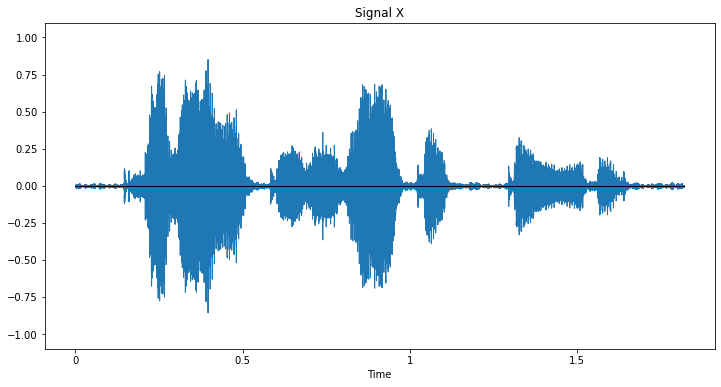

In [15]:
Japanese
displaySignal(Japanese[0])
Audio(Japanese[0],rate=SR)

In [47]:
# Making the signals into lengths of 3 seconds

jVals = []
cVals = []
eVals = []
fVals = []
kVals = [] 
sVals = [] 

current = [Japanese, Chinese, English, French, Korean, Spanish]
ret = [jVals, cVals, eVals, fVals, kVals, sVals]

for langIndex in range(len(current)):
    for signal in current[langIndex]:
        if signal.size > int(SR) * 3:
            ret[langIndex].append(signal[:int(SR)*3])
        else:
            #print(len(signal))
            #print(int(SR) * 3)
            #x1 = np.concatenate([signal, np.zeros(int(SR)*3-signal.size)])
            ret[langIndex].append(np.concatenate([signal, np.zeros(int(SR)*3-signal.size)]))
    
    

In [66]:
import pandas as pd
signalDf = signalDf = pd.DataFrame()
signalDf['Signal'] = (jVals+cVals+eVals+fVals+kVals+sVals)

In [75]:
regular_list = [["Japanese"] * len(jVals) + ["Chinese"] * len(cVals) + ["English"] * len(eVals) + ["French"]*len(fVals) +
                       ["Korean"] * len(kVals) + ["Spanish"] * len(sVals)]
flat_list = [item for sublist in regular_list for item in sublist]
signalDf['Language'] = flat_list

In [62]:
len(jVals+cVals)

800

In [16]:
len(sVals)

50

In [62]:
#languages = [["Japanese"], ["Chinese"], ["English"], ["French"], ["Italian"], ["Korean"], ["Spanish"]]
#regular_list = [language*len(jVals) for language in languages]
#flat_list = [item for sublist in regular_list for item in sublist]
#signalDf["Language"] = flat_list

In [63]:
signalDf

,Signal,Language
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",Japanese
1,"[-0.014767001, 0.018627448, 0.010171069, -0.01...",Japanese
2,"[0.097509086, 0.07818636, 0.065015785, 0.05647...",Japanese
3,"[0.051835965, 0.042226233, 0.026835538, 0.0274...",Japanese
4,"[0.010375157, 0.0017200666, 0.006274107, 0.016...",Japanese
...,...,...
275,"[0.0065255538, 0.008925133, 0.029227208, 0.037...",Spanish
276,"[0.12909006, 0.11924294, 0.10197434, 0.0749696...",Spanish
277,"[0.015661022, 0.0075400653, -0.0033545613, -0....",Spanish
278,"[0.07538871, 0.05018873, 0.028478624, 0.014622...",Spanish


In [77]:
Audio(signalDf['Signal'][279], rate = SR)

In [14]:
current = [sum(librosa.zero_crossings(waveSignal, pad=False)) for waveSignal in signalDf['Signal'][:10]]

In [79]:
#sum of zero crossings rate
zero_crossings = [sum(librosa.zero_crossings(waveSignal, pad=False)) for waveSignal in signalDf['Signal']]
signalDf["Zero Crossings"] = zero_crossings

In [80]:
zero_crossings

[3061,
 1216,
 2660,
 2987,
 1804,
 1118,
 3662,
 1889,
 2965,
 1074,
 989,
 1046,
 1685,
 2370,
 4279,
 3155,
 3431,
 2363,
 6676,
 3741,
 6504,
 5198,
 4539,
 6016,
 3474,
 4110,
 4391,
 2710,
 4050,
 7489,
 3664,
 4875,
 6878,
 4893,
 6832,
 3339,
 7163,
 1404,
 6435,
 6879,
 7347,
 2745,
 2397,
 5160,
 4040,
 8696,
 1099,
 2958,
 3854,
 2557,
 2443,
 1346,
 4601,
 7135,
 7135,
 7581,
 3269,
 3551,
 4735,
 2108,
 4888,
 5093,
 4555,
 1912,
 2255,
 2978,
 2303,
 1457,
 2747,
 1662,
 4035,
 3200,
 831,
 2260,
 1418,
 3692,
 1062,
 2354,
 3637,
 2723,
 2001,
 2211,
 3162,
 2630,
 2777,
 3993,
 1802,
 2436,
 4456,
 7063,
 3066,
 4931,
 2881,
 2445,
 2438,
 5298,
 6673,
 6031,
 2736,
 13323,
 2135,
 1353,
 3560,
 2992,
 2593,
 3264,
 3122,
 2566,
 1838,
 2813,
 3385,
 961,
 3718,
 2430,
 4690,
 4413,
 1009,
 2827,
 16383,
 4587,
 1578,
 3385,
 5193,
 2545,
 3215,
 5435,
 2307,
 7908,
 5657,
 1388,
 1473,
 2939,
 1241,
 939,
 1847,
 1483,
 1330,
 2719,
 968,
 1268,
 2575,
 2477,
 1082,
 6

In [81]:
signalDf

,Signal,Language,Zero Crossings
0,"[-0.003897431306540966, -0.005753827281296253,...",Japanese,3061
1,"[0.0015667888801544905, 0.002116559073328972, ...",Japanese,1216
2,"[0.000708883919287473, 0.0010875944280996919, ...",Japanese,2660
3,"[-0.0015551495598629117, -0.002566479612141847...",Japanese,2987
4,"[0.0015160632319748402, 0.0019920694176107645,...",Japanese,1804
...,...,...,...
2284,"[-8.51912105304109e-08, 8.425058695138432e-08,...",Spanish,3099
2285,"[-8.51912105304109e-08, 8.425058695138432e-08,...",Spanish,2669
2286,"[-4.136195457249414e-06, -5.7554802879167255e-...",Spanish,1567
2287,"[2.7219186904403614e-08, -5.490849019906818e-0...",Spanish,2720


In [82]:
# average of spectral centroid
average_centroids = [np.average(librosa.feature.spectral_centroid(waveSignal, sr=SR)) for waveSignal in signalDf['Signal']]
signalDf["Spectral Centroid"] = average_centroids

In [83]:
average_centroids

[1094.4649477022836,
 599.1369486851786,
 795.1571021340804,
 949.5223514223474,
 880.7632294115235,
 486.0416283278117,
 1219.7008792928305,
 659.9311144772075,
 935.5557591811835,
 550.5029397961309,
 650.0815454020714,
 716.029849122561,
 559.3692457982254,
 934.7646815178564,
 1089.047217339608,
 967.7429085432626,
 1088.707508429117,
 793.3974973925051,
 1231.3215300801469,
 1272.720121427045,
 2180.23817852841,
 1779.001041535287,
 1570.0207142713734,
 1549.7106839368528,
 1230.072629041103,
 1295.9888040212923,
 1276.755685167825,
 1301.4869343815478,
 1541.8574873550933,
 2173.0758855823437,
 1080.0600148856365,
 1633.8345213268883,
 1970.426961888716,
 1567.1462529997314,
 1907.679106907384,
 964.1012714719225,
 1861.1965951540851,
 716.2655824399045,
 1723.0965866364634,
 2150.181904132563,
 2490.585517917005,
 887.5629320617131,
 1078.2979746979781,
 1265.0560164508042,
 1523.8540298366895,
 2376.8056201190457,
 688.8513674953916,
 910.9123869817834,
 1258.671493804017,
 950

In [84]:
# number of onsets
num_onsets = [len(librosa.onset.onset_detect(waveSignal)) for waveSignal in signalDf['Signal']]
signalDf["Onsets"] = num_onsets
num_onsets

[8,
 5,
 6,
 7,
 7,
 3,
 8,
 3,
 6,
 5,
 6,
 8,
 6,
 8,
 6,
 7,
 6,
 7,
 5,
 10,
 8,
 11,
 7,
 12,
 8,
 10,
 5,
 8,
 10,
 13,
 6,
 7,
 10,
 13,
 14,
 5,
 12,
 3,
 11,
 17,
 8,
 6,
 4,
 9,
 12,
 13,
 4,
 6,
 9,
 6,
 8,
 7,
 8,
 11,
 18,
 8,
 6,
 8,
 10,
 5,
 7,
 10,
 9,
 5,
 5,
 6,
 5,
 6,
 4,
 6,
 9,
 7,
 5,
 7,
 6,
 7,
 4,
 4,
 6,
 7,
 7,
 7,
 8,
 6,
 5,
 7,
 7,
 4,
 8,
 10,
 10,
 12,
 4,
 4,
 4,
 6,
 4,
 6,
 7,
 10,
 8,
 6,
 9,
 4,
 5,
 6,
 5,
 4,
 8,
 6,
 9,
 4,
 7,
 7,
 4,
 9,
 4,
 6,
 13,
 8,
 7,
 7,
 4,
 6,
 5,
 14,
 9,
 12,
 15,
 2,
 7,
 4,
 2,
 5,
 8,
 6,
 3,
 8,
 2,
 4,
 5,
 7,
 3,
 7,
 8,
 5,
 6,
 5,
 3,
 10,
 5,
 12,
 7,
 13,
 10,
 2,
 7,
 7,
 7,
 11,
 8,
 11,
 8,
 9,
 15,
 6,
 11,
 11,
 16,
 16,
 11,
 8,
 8,
 16,
 8,
 9,
 13,
 11,
 4,
 12,
 15,
 11,
 8,
 12,
 14,
 11,
 10,
 9,
 18,
 14,
 15,
 13,
 9,
 17,
 16,
 11,
 9,
 14,
 9,
 7,
 6,
 6,
 11,
 14,
 17,
 10,
 10,
 10,
 8,
 11,
 15,
 9,
 12,
 18,
 6,
 8,
 6,
 4,
 2,
 3,
 3,
 8,
 5,
 6,
 5,
 4,
 4,
 4,
 7,
 7,
 7,
 7,
 6,
 8

In [85]:
signalDf

,Signal,Language,Zero Crossings,Spectral Centroid,Onsets
0,"[-0.003897431306540966, -0.005753827281296253,...",Japanese,3061,1094.464948,8
1,"[0.0015667888801544905, 0.002116559073328972, ...",Japanese,1216,599.136949,5
2,"[0.000708883919287473, 0.0010875944280996919, ...",Japanese,2660,795.157102,6
3,"[-0.0015551495598629117, -0.002566479612141847...",Japanese,2987,949.522351,7
4,"[0.0015160632319748402, 0.0019920694176107645,...",Japanese,1804,880.763229,7
...,...,...,...,...,...
2284,"[-8.51912105304109e-08, 8.425058695138432e-08,...",Spanish,3099,1314.071470,8
2285,"[-8.51912105304109e-08, 8.425058695138432e-08,...",Spanish,2669,1117.223771,8
2286,"[-4.136195457249414e-06, -5.7554802879167255e-...",Spanish,1567,811.532672,4
2287,"[2.7219186904403614e-08, -5.490849019906818e-0...",Spanish,2720,1431.710521,12


In [86]:
tempo = [librosa.beat.tempo(waveSignal)[0] for waveSignal in signalDf['Signal']]
signalDf["Tempo"] = tempo
tempo

[135.99917763157896,
 117.45383522727273,
 135.99917763157896,
 129.19921875,
 215.33203125,
 198.76802884615384,
 143.5546875,
 161.4990234375,
 112.34714673913044,
 123.046875,
 112.34714673913044,
 107.666015625,
 215.33203125,
 123.046875,
 117.45383522727273,
 161.4990234375,
 99.38401442307692,
 161.4990234375,
 198.76802884615384,
 129.19921875,
 129.19921875,
 143.5546875,
 107.666015625,
 117.45383522727273,
 129.19921875,
 135.99917763157896,
 151.99908088235293,
 172.265625,
 103.359375,
 103.359375,
 172.265625,
 117.45383522727273,
 129.19921875,
 112.34714673913044,
 143.5546875,
 129.19921875,
 135.99917763157896,
 129.19921875,
 129.19921875,
 112.34714673913044,
 151.99908088235293,
 135.99917763157896,
 123.046875,
 135.99917763157896,
 143.5546875,
 161.4990234375,
 198.76802884615384,
 135.99917763157896,
 184.5703125,
 151.99908088235293,
 135.99917763157896,
 117.45383522727273,
 135.99917763157896,
 151.99908088235293,
 117.45383522727273,
 151.99908088235293,
 1

In [74]:
librosa.feature.mfcc(signalDf["Signal"][0])

array([[-605.5886   , -511.87332  , -416.81744  , ..., -317.3776   ,
        -291.56946  , -287.52478  ],
       [   0.       ,   98.52347  ,  128.42397  , ...,   -8.217407 ,
         -59.647606 ,  -59.06391  ],
       [   0.       ,   33.642597 ,   24.098963 , ...,   73.84916  ,
          58.825665 ,   53.706345 ],
       ...,
       [   0.       ,   -6.76046  ,   -5.4955797, ...,    6.145321 ,
          -1.3524861,   -1.4197234],
       [   0.       ,   -8.305712 ,   -7.613762 , ...,   17.656357 ,
          13.757106 ,    8.628758 ],
       [   0.       ,   -9.314182 ,   -8.958696 , ...,   19.18021  ,
          13.753433 ,    3.3938766]], dtype=float32)

In [87]:
mfccs = [librosa.feature.mfcc(waveSignal) for waveSignal in signalDf['Signal']]

In [88]:
signalDf['mfcc'] = mfccs

In [89]:
signalDf

,Signal,Language,Zero Crossings,Spectral Centroid,Onsets,Tempo,mfcc
0,"[-0.003897431306540966, -0.005753827281296253,...",Japanese,3061,1094.464948,8,135.999178,"[[-464.3829694843586, -459.47971801096287, -45..."
1,"[0.0015667888801544905, 0.002116559073328972, ...",Japanese,1216,599.136949,5,117.453835,"[[-503.1983244517247, -496.78066557655234, -49..."
2,"[0.000708883919287473, 0.0010875944280996919, ...",Japanese,2660,795.157102,6,135.999178,"[[-543.000549560494, -527.835122255009, -524.6..."
3,"[-0.0015551495598629117, -0.002566479612141847...",Japanese,2987,949.522351,7,129.199219,"[[-415.5323816826942, -405.62365543055216, -40..."
4,"[0.0015160632319748402, 0.0019920694176107645,...",Japanese,1804,880.763229,7,215.332031,"[[-454.04942676688955, -446.8878101040384, -44..."
...,...,...,...,...,...,...,...
2284,"[-8.51912105304109e-08, 8.425058695138432e-08,...",Spanish,3099,1314.071470,8,99.384014,"[[-546.2033321210776, -533.9008887545228, -529..."
2285,"[-8.51912105304109e-08, 8.425058695138432e-08,...",Spanish,2669,1117.223771,8,143.554688,"[[-542.118940508316, -533.6969146860263, -525...."
2286,"[-4.136195457249414e-06, -5.7554802879167255e-...",Spanish,1567,811.532672,4,172.265625,"[[-545.1610333041298, -531.3551600996659, -530..."
2287,"[2.7219186904403614e-08, -5.490849019906818e-0...",Spanish,2720,1431.710521,12,95.703125,"[[-547.7105566972241, -536.0756352054374, -523..."


In [90]:
signalDf.to_pickle('AlternativeTrain.pkl', protocol=4)

In [78]:
#signalDf.to_pickle('NewAudioFeatures.pkl', protocol=4)
#signalDf.to_pickle('NewTestFeatures.pkl', protocol=4)

In [ ]:
#signalDf.to_excel('AudioFeatures.xlsx', index=False)  

In [ ]:
#temp = pd.read_excel('AudioFeatures.xlsx')

In [ ]:
#temp["Signal"][0]